# EhV Quality control

In [64]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [65]:
# %load ../common_.py
import sys
sys.path.append("..")
from common import *

In [66]:
from ehv.masking import plot_scip_segmentation
from ehv.core import plot_gate_czi

In [79]:
from umap import UMAP
import time
import math
import pyarrow.parquet as pq
from scip.masking import threshold
from scip.masking import util
from scip.features import texture
import flowutils
from pandas.api.types import CategoricalDtype
from matplotlib.collections import PatchCollection

In [68]:
from aicsimageio import AICSImage

## SCIP computed features

## Load processed frame

In [161]:
df = pq.read_table("/data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/results/scip/202203041148/features.parquet").to_pandas()

In [162]:
df = df.set_index(["meta_panel", "meta_replicate", "meta_P"])
df = df.sort_index()

## Meta information

<AxesSubplot:xlabel='count', ylabel='meta_panel'>

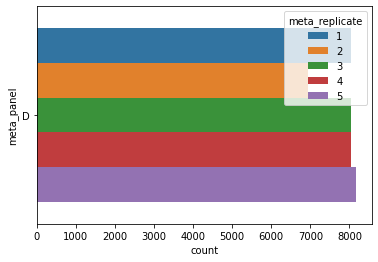

In [163]:
seaborn.countplot(data=df.reset_index(), y="meta_panel", hue="meta_replicate")

In [164]:
# for now only continue with objects from panel D
df = df.loc["D"]
df.shape

(39207, 1494)

## NaN values

In [165]:
# show all NaN columns
df.columns[df.isna().all(axis=0)]

Index([], dtype='object')

## Low variance features

In [166]:
v = df.filter(regex="feat").var()

In [167]:
v.isna().sum()

0

In [168]:
low_var = df.filter(regex="feat").columns[df.filter(regex="feat").var() < 0.001]

In [169]:
low_var

Index(['feat_euler_number_combined', 'feat_solidity_combined',
       'feat_moments_central-0-1_combined',
       'feat_moments_central-1-0_combined', 'feat_moments_hu-0_combined',
       'feat_moments_hu-1_combined', 'feat_moments_hu-2_combined',
       'feat_moments_hu-3_combined', 'feat_moments_hu-4_combined',
       'feat_moments_hu-5_combined',
       ...
       'feat_combined_glcm_std_homogeneity_5_PGC',
       'feat_combined_glcm_mean_energy_3_PGC',
       'feat_combined_glcm_mean_energy_5_PGC',
       'feat_combined_glcm_std_energy_3_PGC',
       'feat_combined_glcm_std_energy_5_PGC',
       'feat_combined_glcm_std_correlation_3_PGC',
       'feat_combined_glcm_mean_ASM_3_PGC',
       'feat_combined_glcm_mean_ASM_5_PGC', 'feat_combined_glcm_std_ASM_3_PGC',
       'feat_combined_glcm_std_ASM_5_PGC'],
      dtype='object', length=230)

In [170]:
df = df.drop(columns=low_var)

## Well effects

In [171]:
df["meta_loc_r"] = df["meta_bbox_minr"] + (df["meta_bbox_maxr"] - df["meta_bbox_minr"]) / 2
df["meta_loc_c"] = df["meta_bbox_minc"] + (df["meta_bbox_maxc"] - df["meta_bbox_minc"]) / 2

In [172]:
border_margin = 30
w, h = 1144, 1144

def is_outside_border(r):
    if (r.meta_loc_r - border_margin < 0) or (r.meta_loc_r + border_margin > h):
        return False
    if (r.meta_loc_c - border_margin < 0) or (r.meta_loc_c + border_margin > w):
        return False
    return True

df["meta_out_border"] = df.apply(is_outside_border, axis="columns")

1-1 2-1 3-1 4-1 5-1 6-1 7-1 8-1 9-1 10-1 11-1 12-1 13-1 14-1 15-1 16-1 17-1 18-1 19-1 20-1 21-1 22-1 23-1 24-1 25-1 1-2 2-2 3-2 4-2 5-2 6-2 7-2 8-2 9-2 10-2 11-2 12-2 13-2 14-2 16-2 17-2 18-2 19-2 20-2 21-2 22-2 23-2 24-2 25-2 1-3 2-3 3-3 4-3 5-3 6-3 7-3 8-3 9-3 10-3 11-3 12-3 13-3 14-3 15-3 16-3 17-3 18-3 19-3 20-3 21-3 22-3 23-3 24-3 25-3 1-4 2-4 3-4 4-4 5-4 6-4 7-4 8-4 9-4 10-4 11-4 12-4 13-4 14-4 15-4 16-4 17-4 18-4 19-4 20-4 22-4 23-4 24-4 25-4 1-5 2-5 3-5 4-5 5-5 6-5 7-5 8-5 9-5 10-5 11-5 12-5 13-5 14-5 15-5 16-5 17-5 18-5 19-5 20-5 21-5 22-5 23-5 24-5 25-5 

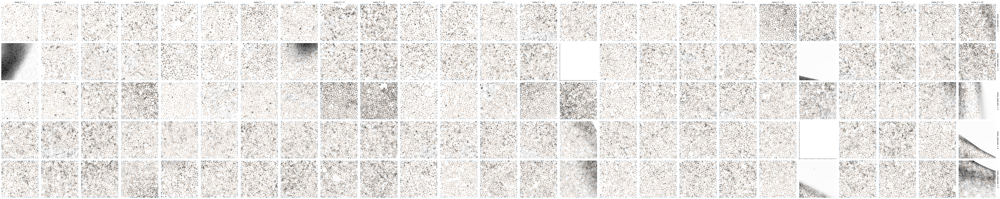

In [141]:
im = AICSImage(df["meta_path"].iloc[0], reconstruct_mosaic=False)

def draw_tile(data, x, y, *args, **kwargs):
    ax = seaborn.scatterplot(data=data, x=x, y=y, **kwargs)
    p, rep = data["meta_P"].iloc[0], data["meta_replicate"].iloc[0]
    im.set_scene(f"P{p}-D{rep}")
    ax.imshow(numpy.max(im.get_image_data("ZXY", C=0), axis=0), origin="lower", cmap="Greys")
    ax.set_axis_off()
    print(f"{p}-{rep}", end=" ")

grid = seaborn.FacetGrid(data=df.reset_index(), col="meta_P", row="meta_replicate", margin_titles=True)
grid.map_dataframe(draw_tile, y="meta_loc_r", x="meta_loc_c", hue="meta_out_border", s=6, edgecolors="none")

In [173]:
bad_indices = [
    (2, 1), (2,21),
    (3, 25),
    (4, 25),
    (5, 25), (5, 21)
]

In [174]:
df = df.drop(index=bad_indices)

In [175]:
df = df[df["meta_out_border"]]

In [176]:
df.shape

(34065, 1267)

# Detecting multiplets

In [177]:
aspect_ratio = df["feat_major_axis_length_Bright"] / df["feat_minor_axis_length_Bright"]

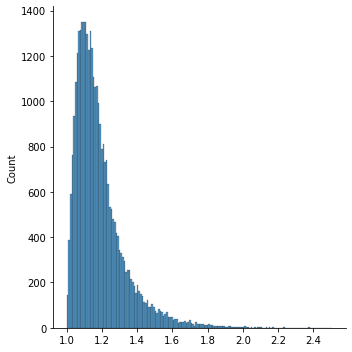

In [178]:
seaborn.displot(data=aspect_ratio)

0 P10-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P12-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P16-D4 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P18-D1 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P20-D2 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P23-D2 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P24-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P6-D4 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P6-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P9-D2 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi


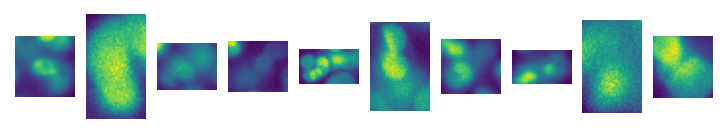

In [179]:
sel1 = aspect_ratio > 2
plot_gate_czi(sel1, df, maxn=10)

In [180]:
df = df[~sel1]
df.shape

(34006, 1267)

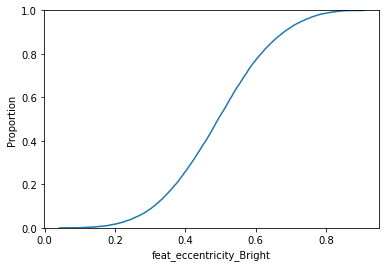

In [181]:
ax = seaborn.ecdfplot(data=df.reset_index(), x="feat_eccentricity_Bright")

0 P10-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P12-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P13-D2 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P2-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P20-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P24-D2 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P4-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P6-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P9-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P9-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi


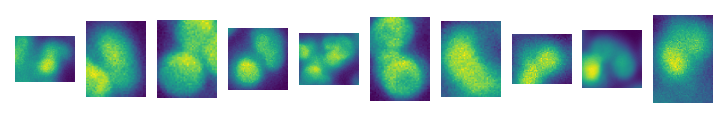

In [182]:
sel1 = df["feat_eccentricity_Bright"] > 0.75
plot_gate_czi(sel1, df, maxn=10)

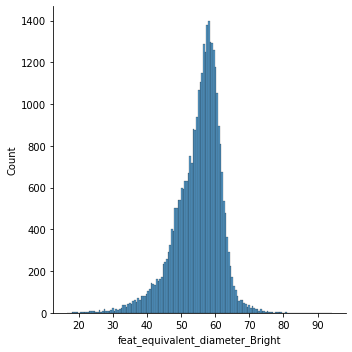

In [186]:
seaborn.displot(data=df.reset_index(), x="feat_equivalent_diameter_Bright", kind="hist")

0 P13-D2 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P13-D4 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P24-D2 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P6-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P9-D4 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi


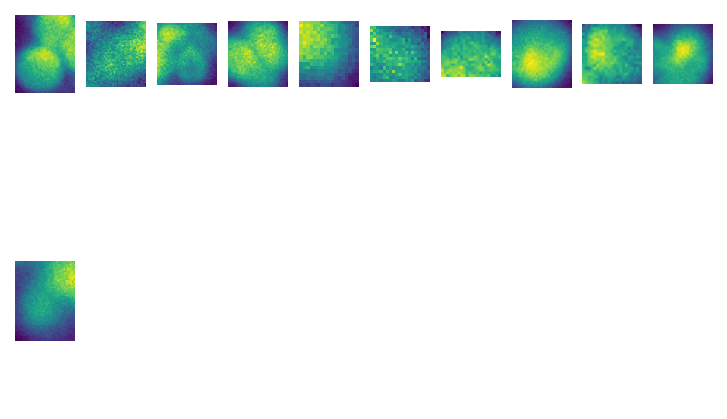

In [187]:
sel1 = df["feat_equivalent_diameter_Bright"].between(0, 20)
plot_gate_czi(sel1, df, maxn=15)

# Texture features

<AxesSubplot:ylabel='Frequency'>

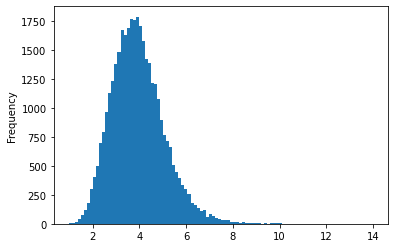

In [26]:
df["feat_glcm_mean_contrast_3_Bright"].plot.hist(bins=100)

0 P12-D1 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P12-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P19-D4 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P21-D4 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi


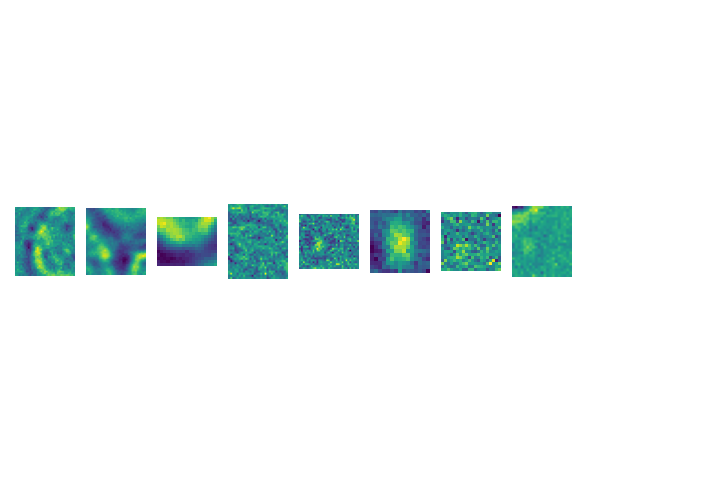

In [25]:
sel1 = df["feat_glcm_mean_contrast_3_Bright"] > 10
plot_gate_czi(sel1, df, maxn=15, channel=4)

In [26]:
df = df[~sel1]
df.shape

(29350, 1269)

<AxesSubplot:>

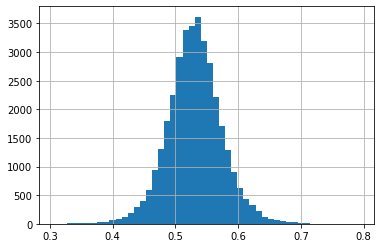

In [27]:
df["feat_glcm_mean_homogeneity_3_DAPI"].hist(bins=50)

<AxesSubplot:>

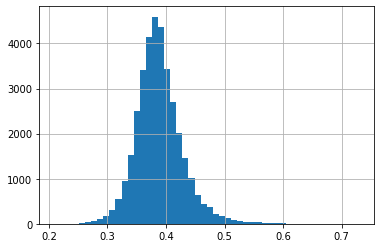

In [28]:
df["feat_glcm_mean_homogeneity_5_DAPI"].hist(bins=50)

0 P11-D2 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P11-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P12-D1 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P12-D4 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P12-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P15-D4 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P16-D2 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P16-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P16-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P20-D4 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P21-D4 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P7-D1 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P9-D5 /data/gent/vo/000/gvo

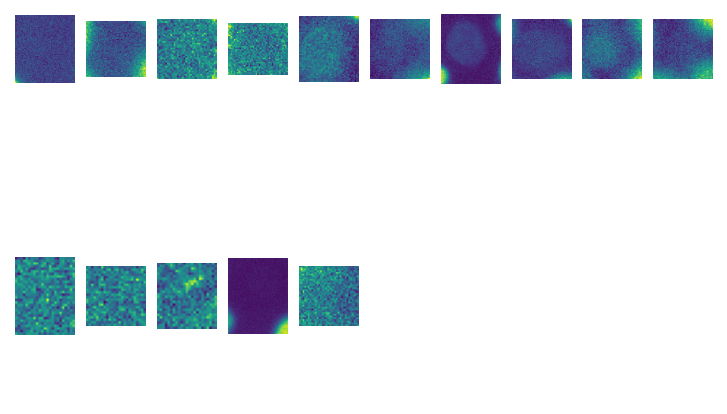

In [28]:
sel1 = df["feat_glcm_mean_homogeneity_3_DAPI"] < .4
plot_gate_czi(sel1, df, maxn=15, channel=0)

In [29]:
df = df[~sel1]
df.shape

(29321, 1269)

# Feature distributions

In [188]:
per_image_exprs = df.reset_index().pivot_table(index=["meta_replicate"], columns=["meta_P"], values=["feat_sum_DAPI", "feat_sum_EGFP", "feat_sum_RPe", "feat_sum_Bright"], aggfunc=numpy.mean)

In [189]:
def draw_heat(*args, data, **kwargs):
    seaborn.heatmap(
        data.drop(columns="meta_replicate"),
        cbar=True,
        **kwargs
    )

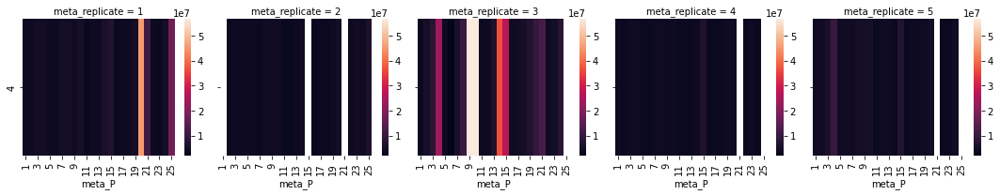

In [190]:
grid = seaborn.FacetGrid(data=per_image_exprs["feat_sum_DAPI"].reset_index(), col="meta_replicate")
grid.map_dataframe(draw_heat, vmin=per_image_exprs["feat_sum_DAPI"].min().min(), vmax=per_image_exprs["feat_sum_DAPI"].max().max())

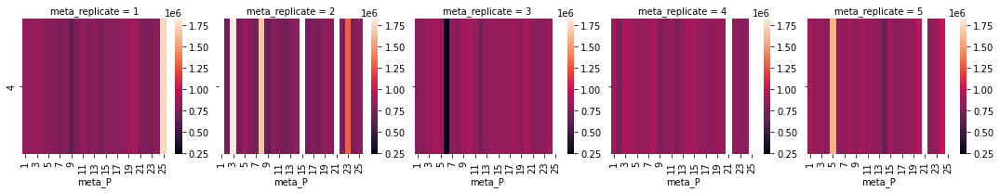

In [191]:
grid = seaborn.FacetGrid(data=per_image_exprs["feat_sum_RPe"].reset_index(), col="meta_replicate")
grid.map_dataframe(draw_heat, vmin=per_image_exprs["feat_sum_RPe"].min().min(), vmax=per_image_exprs["feat_sum_RPe"].max().max())

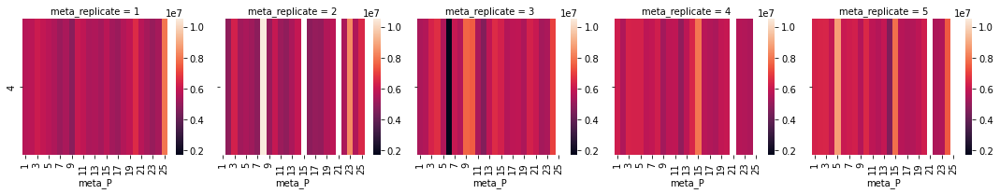

In [192]:
grid = seaborn.FacetGrid(data=per_image_exprs["feat_sum_EGFP"].reset_index(), col="meta_replicate")
grid.map_dataframe(draw_heat, vmin=per_image_exprs["feat_sum_EGFP"].min().min(), vmax=per_image_exprs["feat_sum_EGFP"].max().max())

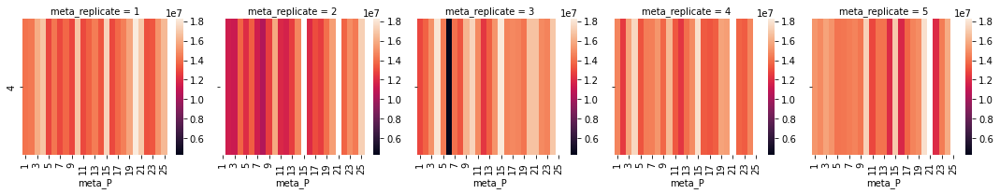

In [193]:
grid = seaborn.FacetGrid(data=per_image_exprs["feat_sum_Bright"].reset_index(), col="meta_replicate")
grid.map_dataframe(draw_heat, vmin=per_image_exprs["feat_sum_Bright"].min().min(), vmax=per_image_exprs["feat_sum_Bright"].max().max())

CPU times: user 1min 17s, sys: 316 ms, total: 1min 18s
Wall time: 1min 18s


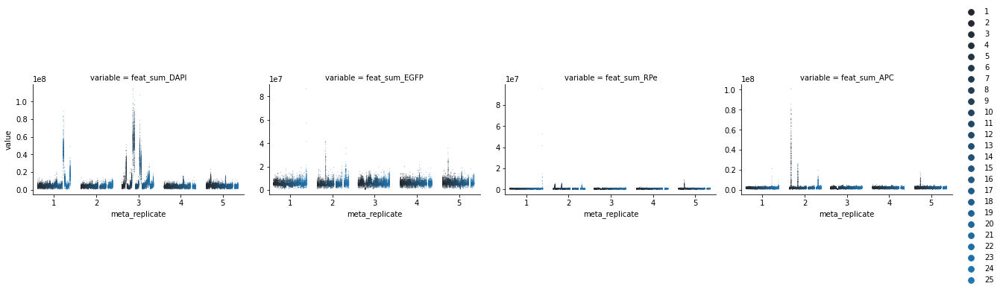

In [195]:
%%time
melted_df = pandas.melt(df.reset_index(), id_vars=["meta_P", "meta_replicate"], value_vars=df.filter(regex="feat_sum_(DAPI|EGFP|RPe|APC)").columns)
grid = seaborn.FacetGrid(data=melted_df, col="variable", sharey=False, aspect=1.5)
grid.map_dataframe(seaborn.stripplot, x="meta_replicate", y="value", hue="meta_P", dodge=True, size=1, alpha=0.5)
grid.add_legend()

<AxesSubplot:xlabel='meta_P', ylabel='feat_sum_DAPI'>

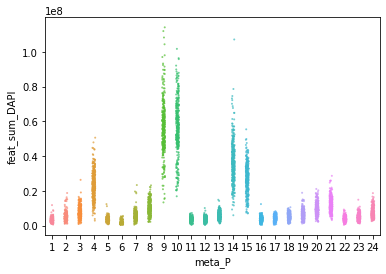

In [198]:
seaborn.stripplot(data=df.loc[3].reset_index(), y="feat_sum_DAPI", x="meta_P", s=2, alpha=0.7)

<AxesSubplot:xlabel='meta_P', ylabel='feat_sum_APC'>

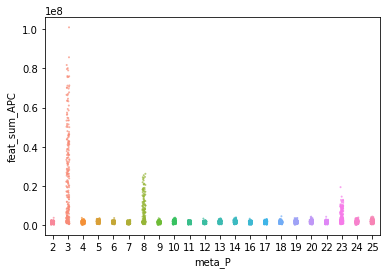

In [199]:
seaborn.stripplot(data=df.loc[2].reset_index(), y="feat_sum_APC", x="meta_P", s=2, alpha=0.7)

In [200]:
gdf = df.groupby(["meta_replicate", "meta_P"])[df.filter(regex="feat_sum_(DAPI|EGFP|RPe|APC)").columns]

In [201]:
def func(x):
    q = x.quantile(q=(0.05, 0.95))
    return (x - q.loc[0.05]) / (q.loc[0.95] - q.loc[0.05])
df_mm = gdf.transform(func)
df[df_mm.columns] = df_mm

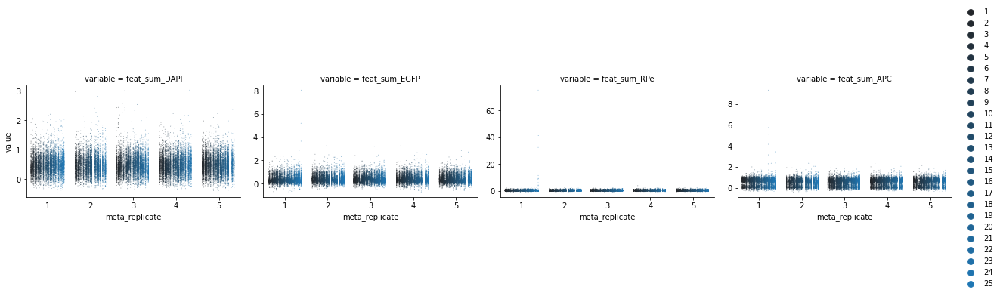

In [202]:
melted_df = pandas.melt(df.reset_index(), id_vars=["meta_P", "meta_replicate"], value_vars=df.filter(regex="feat_sum_(DAPI|EGFP|RPe|APC)").columns)
grid = seaborn.FacetGrid(data=melted_df, col="variable", sharey=False, aspect=1.5)
grid.map_dataframe(seaborn.stripplot, x="meta_replicate", y="value", hue="meta_P", dodge=True, size=1, alpha=0.5)
grid.add_legend()

### DAPI

<AxesSubplot:xlabel='feat_sum_DAPI', ylabel='Count'>

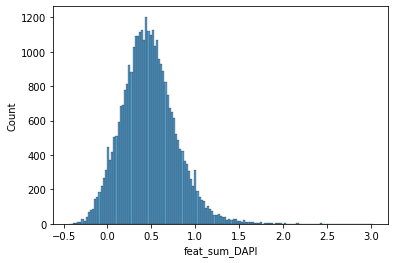

In [203]:
seaborn.histplot(data=df.reset_index(), x="feat_sum_DAPI")

<AxesSubplot:xlabel='feat_sum_DAPI', ylabel='Count'>

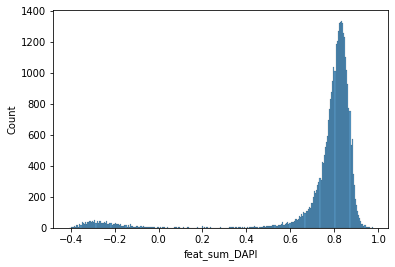

In [204]:
asinh_dapi = flowutils.transforms.asinh(df["feat_sum_DAPI"], channel_indices=None, t=4, m=4, a=1)
seaborn.histplot(data=asinh_dapi)

In [205]:
numpy.unique(asinh_dapi > 0.6, return_counts=True)

(array([False,  True]), array([ 2411, 31595]))

0 P1-D2 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P11-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P14-D2 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P14-D4 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P15-D1 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P15-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P16-D1 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P17-D2 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P20-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P23-D2 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P3-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P5-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P6-D5 /data/gent/vo/000/gvo00

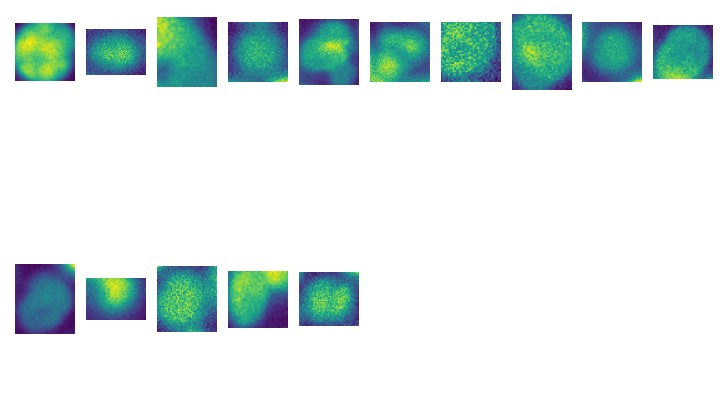

In [46]:
sel1 = asinh_dapi < 0.6
plot_gate_czi(sel1, df, maxn=15, channel=0)

0 P13-D1 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P14-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P16-D1 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P19-D4 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P2-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P20-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P21-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P22-D4 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P23-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P3-D2 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P8-D5 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P9-D3 /data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/Experiment-800.czi
0 P9-D5 /data/gent/vo/000/gvo000

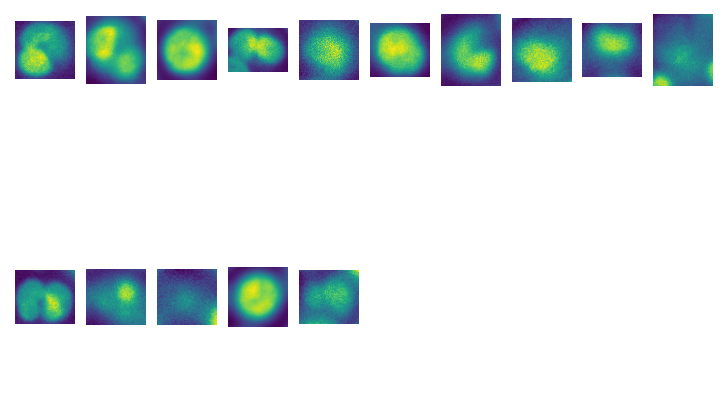

In [47]:
sel1 = asinh_dapi > 0.6
plot_gate_czi(sel1, df, maxn=15, channel=0)

In [58]:
df["meta_dapi_positive"] = asinh_dapi > 0.6

### CD45

<AxesSubplot:xlabel='feat_sum_EGFP', ylabel='Count'>

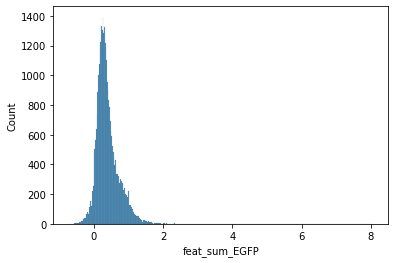

In [206]:
seaborn.histplot(data=df.reset_index(), x="feat_sum_EGFP")

<AxesSubplot:xlabel='feat_sum_DAPI', ylabel='Count'>

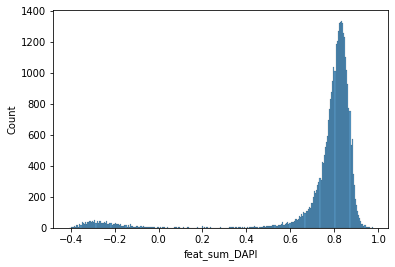

In [207]:
asinh_egfp = flowutils.transforms.asinh(df["feat_sum_EGFP"], channel_indices=None, t=4, m=4, a=1)
seaborn.histplot(data=asinh_dapi)

In [208]:
numpy.unique(asinh_egfp > 0.6, return_counts=True)

(array([False,  True]), array([ 2672, 31334]))

In [54]:
df["meta_cd45_positive"] = asinh_egfp > 0.6

<AxesSubplot:xlabel='feat_sum_EGFP', ylabel='feat_sum_DAPI'>

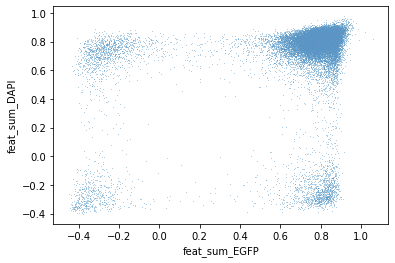

In [56]:
seaborn.scatterplot(x=asinh_egfp, y=asinh_dapi, s=1, alpha=0.5)

### APC (CD15)

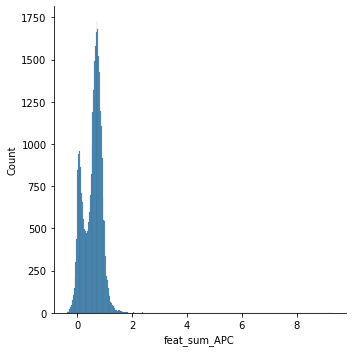

In [209]:
seaborn.displot(data=df.reset_index(), x="feat_sum_APC")

In [210]:
asinh_apc = flowutils.transforms.asinh(df["feat_sum_APC"], channel_indices=None, t=2, m=5, a=1)

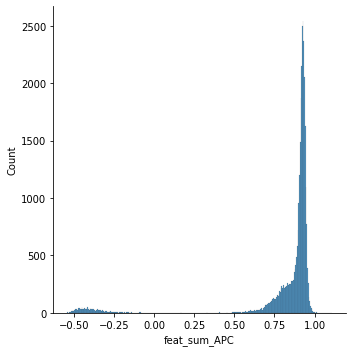

In [211]:
seaborn.displot(data=asinh_apc)

In [75]:
df["meta_CD15_positive"] = asinh_apc > 0.6

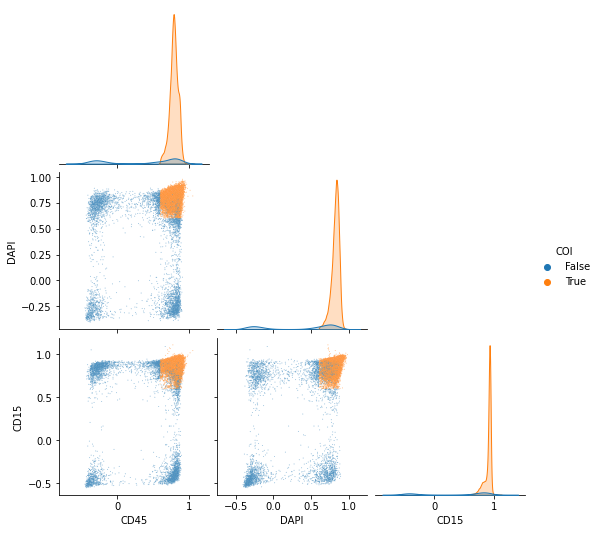

In [88]:
tmp_df = pandas.DataFrame(dict(CD45=asinh_egfp, DAPI=asinh_dapi, CD15=asinh_apc))
tmp_df["COI"] = (df["meta_CD15_positive"] & df["meta_dapi_positive"] & df["meta_cd45_positive"])
seaborn.pairplot(
    tmp_df.reset_index(drop=True), corner=True, 
    plot_kws=dict(s=1, alpha=0.5), 
    hue="COI"
)

In [89]:
tmp_df["COI"].value_counts()

True     30775
False     4906
Name: COI, dtype: int64

# Export

In [361]:
numpy.save("/data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/results/scip/202203021530/index.npy", df.index.values)

In [362]:
numpy.save("/data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/results/scip/202203021530/columns.npy", df.columns.values)

In [77]:
import pyarrow

In [85]:
df = df.reset_index()

In [86]:
sel1 = df["meta_dapi_positive"]
sel2 = df["meta_CD15_positive"]

pq.write_table(
    pyarrow.Table.from_pandas(df[sel1 & sel2][df.filter(regex="meta").columns]),
    "/data/gent/vo/000/gvo00070/vsc42015/datasets/cd7/800/results/scip/202203021530/for_annotator.parquet"
)